## Step-by-step instructions to interact HEST-1k 

This tutorial will guide you to:

- Read HEST data
- Visualized the spots over a downscaled version of the WSI
- Saving HESTData into Pyramidal Tif and anndata


This tutorial assumes that the user has already downloaded HEST-1k (in its entirety or partially). 

### Read HEST

In [1]:
from hest import iter_hest
from hest.readers import pool_cell_transcripts_xenium

name = 'TENX147'

# Iterate through a subset of hest
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=[name], load_transcripts=True):
    print(st.transcript_df)
    shapes = st.get_shapes('xenium_cell', 'he').shapes
    st.adata = pool_cell_transcripts_xenium(
                    st.transcript_df, # Feel free to convert st.transcript_df to a Dask DataFrame if you are working with limited RAM.
                    st.pixel_size, 
                    shapes=shapes,
                    key_x='he_x',
                    key_y='he_y',
                )
patcher, barcodes = st.dump_patches(
        '/mnt/DATA16T/Xenium/wsi_patches/',
        name=name,
        target_patch_size=224, # target patch size in 224
        target_pixel_size=st.pixel_size # pixel size of the patches in um/px after rescaling
    )
import numpy as np
cell_bool = np.isin(st.adata.obs_names.values, barcodes)
images = []
for i in range(len(barcodes)):
	images.append(patcher[i][0])
cell_adata = st.adata[cell_bool]
cell_adata.obsm['img'] = np.array(images)
cell_adata.uns['wsi_shape'] = [st.wsi.height, st.wsi.width]
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=[name]):
    # ST (adata):
    adata = st.adata
    print('\n* Scanpy adata:')
    print(adata)
cell_adata.uns['spatial'] = st.adata.uns['spatial']

/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/hestcore/wsi.py:27: UserWarning: CuImage is not available. Ensure you have a GPU and cucim installed to use GPU acceleration.
  warnings.warn("CuImage is not available. Ensure you have a GPU and cucim installed to use GPU acceleration.")


            transcript_id     cell_id  overlaps_nucleus feature_name  \
0         281895883534663  UNASSIGNED                 0         SPP1   
1         281895883544763  UNASSIGNED                 0       NOTCH3   
2         281895883544764  UNASSIGNED                 0       NOTCH3   
3         281895883685551  UNASSIGNED                 0          MYC   
4         281895883521797  UNASSIGNED                 0        ACTA2   
...                   ...         ...               ...          ...   
46255596  281891588584410  UNASSIGNED                 0        MYH14   
46255597  281891588584414  UNASSIGNED                 0        PRDX4   
46255598  281891588584420  UNASSIGNED                 0        MYH14   
46255599  281891588584423  UNASSIGNED                 0         CD24   
46255600  281891588584428  UNASSIGNED                 0         CD24   

           x_location   y_location  z_location         qv fov_name  \
0           -0.166830  5962.744629   30.104498   7.790324       L

/home/whytin/Research/Project/HEST/src/hest/HESTData.py:379: UserWarning: indices of adata.obs should all have the same length to avoid problems when saving to h5
  warnings.warn("indices of adata.obs should all have the same length to avoid problems when saving to h5", UserWarning)


KeyboardInterrupt: 

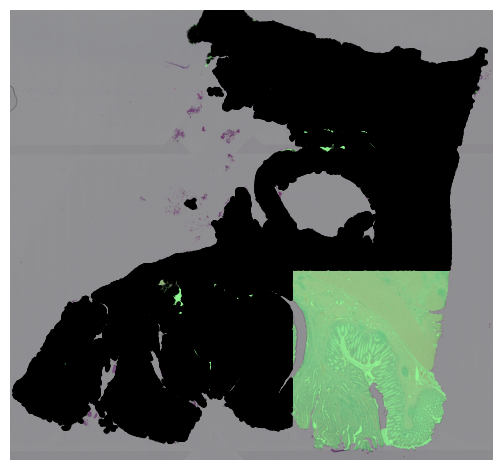

In [2]:
import pandas as pd
from shapely import wkb

df = pd.read_parquet("/mnt/DATA16T/hest_data/cellvit_seg/{}_cellvit_seg.parquet".format(name))
# 解码 WKB 二进制为多边形
polygons = df.geometry.apply(lambda x: wkb.loads(x, hex=False))

# 提取中心点 (x, y)
centroid_list = [(poly.centroid.x, poly.centroid.y) for poly in polygons]

patcher, positions = st.dump_noseq_cell_patches(
    '/mnt/DATA16T/Xenium/wsi_patches/',
    name=name,
    target_patch_size=224, # target patch size in 224
    #target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
    target_pixel_size=st.pixel_size,
    centroid_list=centroid_list
)


In [ ]:
import pandas as pd
from shapely import wkb
from hest import iter_hest
from hest.readers import pool_cell_transcripts_xenium

name = 'TENX147'

# Iterate through a subset of hest
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=[name], load_transcripts=True):
    print(st.transcript_df)
df = pd.read_parquet("/mnt/DATA16T/hest_data/cellvit_seg/{}_cellvit_seg.parquet".format(name))
# 解码 WKB 二进制为多边形
polygons = df.geometry.apply(lambda x: wkb.loads(x, hex=False))

# 提取中心点 (x, y)
centroid_list = [(poly.centroid.x, poly.centroid.y) for poly in polygons]

patcher, positions = st.dump_all_cell_patches(
    '/mnt/DATA16T/Xenium/wsi_patches/',
    name=name,
    target_patch_size=224, # target patch size in 224
    #target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
    target_pixel_size=st.pixel_size,
    centroid_list=centroid_list
)


In [3]:
len(patcher)

1183696

In [4]:
import numpy as np
images = []
for i in range(len(patcher)):
	if i%2==0:
		continue
	print(i)
	images.append(patcher[i][0])
cell_adata.uns['noseq_img'] = np.array(images)
cell_adata.uns['noseq_spatial'] = positions

1
3
5
7
9
11
13
15
17
19
21
23
25
27
29
31
33
35
37
39
41
43
45
47
49
51
53
55
57
59
61
63
65
67
69
71
73
75
77
79
81
83
85
87
89
91
93
95
97
99
101
103
105
107
109
111
113
115
117
119
121
123
125
127
129
131
133
135
137
139
141
143
145
147
149
151
153
155
157
159
161
163
165
167
169
171
173
175
177
179
181
183
185
187
189
191
193
195
197
199
201
203
205
207
209
211
213
215
217
219
221
223
225
227
229
231
233
235
237
239
241
243
245
247
249
251
253
255
257
259
261
263
265
267
269
271
273
275
277
279
281
283
285
287
289
291
293
295
297
299
301
303
305
307
309
311
313
315
317
319
321
323
325
327
329
331
333
335
337
339
341
343
345
347
349
351
353
355
357
359
361
363
365
367
369
371
373
375
377
379
381
383
385
387
389
391
393
395
397
399
401
403
405
407
409
411
413
415
417
419
421
423
425
427
429
431
433
435
437
439
441
443
445
447
449
451
453
455
457
459
461
463
465
467
469
471
473
475
477
479
481
483
485
487
489
491
493
495
497
499
501
503
505
507
509
511
513
515
517
519
521
523
525
527

In [5]:
cell_adata.write('/mnt/DATA16T/Xenium/Xenium_Human_Colon_Cancer147_cell_HEST.h5ad')

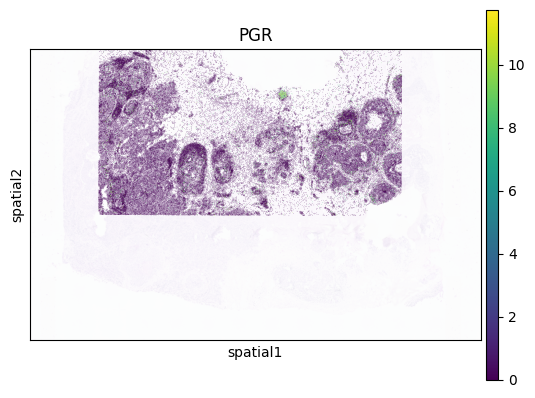

In [17]:
import scanpy as sc
sc.pl.spatial(
    cell_adata,
    color="PGR",        
    img_key='downscaled_fullres',          # 也可选，默认使用 'hires' 或 'lowres'
    spot_size=30,
    cmap="viridis",
    use_raw = False,
    alpha=1,         # 点不透明
    alpha_img=0.1, 
    crop_coord=(0, cell_adata.uns['wsi_shape'][1], 0, cell_adata.uns['wsi_shape'][0])
)

In [3]:

import numpy as np
import scipy.sparse as sp
from tqdm import tqdm
import scanpy as sc
def normalize_adata(adata, scale=1e6, smooth=False):# type: ignore
    """
    Normalize each spot by total gene counts + Logarithmize each spot
    """
    
    import scanpy as sc
    
    filtered_adata = adata.copy()
    
    if smooth:
        adata_df = adata.to_df()
        for index, df_row in adata.obs.iterrows():
            row = int(df_row['array_row'])
            col = int(df_row['array_col'])
            neighbors_index = adata.obs[((adata.obs['array_row'] >= row - 1) & (adata.obs['array_row'] <= row + 1)) & \
                ((adata.obs['array_col'] >= col - 1) & (adata.obs['array_col'] <= col + 1))].index
            neighbors = adata_df.loc[neighbors_index]
            nb_neighbors = len(neighbors)
            
            avg = neighbors.sum() / nb_neighbors
            filtered_adata[index] = avg
    
    
    sc.pp.normalize_total(filtered_adata, target_sum=1, inplace=True)
    # Facilitate training when using the MSE loss. 
    # This'trick' is also used by Y. Zeng et al in "Spatial transcriptomics prediction from histology jointly through Transformer and graph neural networks"
    filtered_adata.X = filtered_adata.X * scale 
    
    # Logarithm of the expression
    sc.pp.log1p(filtered_adata) 
    filtered_adata.raw = adata

    return filtered_adata

def compute_spot_gene(adata, window_size=200):
    coords = adata.obsm['spatial']
    radius = window_size // 2
    X = adata.X
    n_cells = coords.shape[0]
    
    is_sparse = sp.issparse(X)
    spot_gene = []

    for i in tqdm(range(n_cells), desc="Computing spot_gene"):
        xi, yi = coords[i]
        dx = np.abs(coords[:, 0] - xi)
        dy = np.abs(coords[:, 1] - yi)
        mask = (dx <= radius) & (dy <= radius)
        if is_sparse:
            summed = X[mask].sum(axis=0).A1 # flatten sparse sum to 1D array
        else:
            summed = X[mask].sum(axis=0)
        spot_gene.append(summed)

    adata.obsm['spot_gene'] = np.vstack(spot_gene)
    return adata

In [5]:
xenium_adata = sc.read_h5ad('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer784_cell_HEST.h5ad')

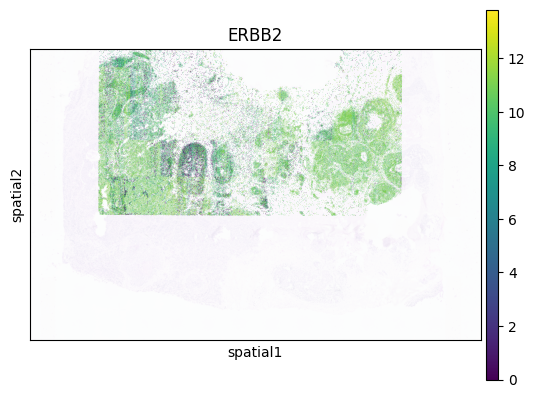

In [57]:
import scanpy as sc
sc.pl.spatial(
    xenium_adata,
    color="ERBB2",        
    img_key='downscaled_fullres',          # 也可选，默认使用 'hires' 或 'lowres'
    spot_size=30,
    cmap="viridis",
    use_raw = False,
    alpha=1,         # 点不透明
    alpha_img=0.1, 
    crop_coord=(0, cell_adata.uns['wsi_shape'][1], 0, cell_adata.uns['wsi_shape'][0])
)

In [16]:
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=[name], load_transcripts=True):
    print(st.transcript_df)

            transcript_id  cell_id  overlaps_nucleus  \
0         281474976710656      565                 0   
1         281474976710657      540                 0   
2         281474976710658      562                 0   
3         281474976710659      271                 0   
4         281474976710660      291                 0   
...                   ...      ...               ...   
42638078  281805689407068       -1                 0   
42638079  281805689407071   135717                 1   
42638080  281805689407078       -1                 0   
42638081  281805689407083       -1                 0   
42638082  281805689407092   135716                 0   

                        feature_name   x_location   y_location  z_location  \
0                          b'SEC11C'     4.395842   328.666473   12.019493   
1         b'NegControlCodeword_0502'     5.074415   236.964844    7.608510   
2                          b'SEC11C'     4.702023   322.797150   12.289083   
3              

/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/scanpy/preprocessing/_qc.py:432: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]


In [17]:
st.adata

AnnData object with n_obs × n_vars = 4180 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
cell_adata

AnnData object with n_obs × n_vars = 165177 × 541
    obs: 'in_tissue', 'n_counts'
    uns: 'wsi_shape', 'spatial', 'noseq_img', 'noseq_spatial'
    obsm: 'spatial', 'img'

In [8]:
xenium_adata.uns['noseq_img'] = cell_adata.uns['noseq_img']
xenium_adata.uns['noseq_spatial'] = cell_adata.uns['noseq_spatial']

In [9]:
xenium_adata

AnnData object with n_obs × n_vars = 109725 × 306
    obs: 'in_tissue', 'n_counts'
    uns: 'log1p', 'spatial', 'wsi_shape', 'noseq_img', 'noseq_spatial'
    obsm: 'img', 'spatial', 'spot_gene', 'virchow2_cell_embed', 'virchow2_norm_embed'

In [7]:
cell_adata.write('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer785_cell_HEST.h5ad')

In [4]:
from hest import iter_hest

# Iterate through a subset of hest
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=['TENX147']):

    # ST (adata):
    adata = st.adata
    print('\n* Scanpy adata:')
    print(adata)

    # WSI:
    wsi = st.wsi
    print('\n* WSI:')
    print(wsi)
    
    # Shapes:
    shapes = st.shapes
    print('\n* Shapes:')
    print(shapes)
    
    # Tissue segmentation
    tissue_contours = st.tissue_contours
    print('\n* Tissue contours:')
    print(tissue_contours)
    
    # Conversion to SpatialData
    sdata = st.to_spatial_data()
    print('\n* SpatialData conversion:')
    print(sdata)


/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/hestcore/wsi.py:27: UserWarning: CuImage is not available. Ensure you have a GPU and cucim installed to use GPU acceleration.
  warnings.warn("CuImage is not available. Ensure you have a GPU and cucim installed to use GPU acceleration.")



* Scanpy adata:
AnnData object with n_obs × n_vars = 3997 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mito'
    uns: 'spatial'
    obsm: 'spatial'

* WSI:
<width=71082, height=66226, backend=OpenSlideWSI>

* Shapes:
[name: cellvit, coord-system: he, <not loaded>, name: xenium_cell, coord-system: he, <not loaded>, name: xenium_nucleus, coord-system: he, <not loaded>]

* Tissue contours:
   tissue_id                                           geometry
0          0  POLYGON ((27161 27701.9, 27160.9902 27701.9004...
1          

/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)



* SpatialData conversion:
SpatialData object
├── Images
│     ├── 'ST_downscaled_hires_image': SpatialImage[cyx] (3, 4139, 4442)
│     └── 'ST_downscaled_lowres_image': SpatialImage[cyx] (3, 932, 1000)
├── Shapes
│     ├── 'cellvit': GeoDataFrame shape: (1446561, 3) (2D shapes)
│     ├── 'locations': GeoDataFrame shape: (3997, 2) (2D shapes)
│     ├── 'tissue_contours': GeoDataFrame shape: (3, 2) (2D shapes)
│     ├── 'xenium_cell': GeoDataFrame shape: (275998, 1) (2D shapes)
│     └── 'xenium_nucleus': GeoDataFrame shape: (256552, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (3997, 541)
with coordinate systems:
    ▸ 'ST_downscaled_hires', with elements:
        ST_downscaled_hires_image (Images), cellvit (Shapes), locations (Shapes), tissue_contours (Shapes), xenium_cell (Shapes), xenium_nucleus (Shapes)
    ▸ 'ST_downscaled_lowres', with elements:
        ST_downscaled_lowres_image (Images), cellvit (Shapes), locations (Shapes), tissue_contours (Shapes), xenium_cell (Shapes

In [9]:
import pickle
import numpy as np
with open('/mnt/DATA16T/Xenium/gene_list_147', 'wb') as f:
	pickle.dump(list(st.adata.var_names.values), f)

In [11]:
st.adata.uns['spatial']['ST']['images']['downscaled_fullres'].shape

(787, 1000, 3)

`st.adata` is a spatial scanpy object containing the following:
## Observations (st.adata.obs)
- `in_tissue`: Indicator if the observation is within the tissue (`in_tissue` comes from the initial Visium/Xenium run and might not be accurate, prefer the segmentation obtained by st.segment_tissue() instead).
- `pxl_col_in_fullres`: Pixel column position of the patch/spot centroid in the full resolution image.
- `pxl_row_in_fullres`: Pixel row position of the patch/spot centroid in the full resolution image.
- `array_col`: Patch/spot column position in the array.
- `array_row`: Patch/spot row position in the array.
- `n_counts`: Number of counts for each observation.
- `n_genes_by_counts`: Number of genes detected by counts in each observation.
- `log1p_n_genes_by_counts`: Log-transformed number of genes detected by counts.
- `total_counts`: Total counts per observation.
- `log1p_total_counts`: Log-transformed total counts.
- `pct_counts_in_top_50_genes`: Percentage of counts in the top 50 genes.
- `pct_counts_in_top_100_genes`: Percentage of counts in the top 100 genes.
- `pct_counts_in_top_200_genes`: Percentage of counts in the top 200 genes.
- `pct_counts_in_top_500_genes`: Percentage of counts in the top 500 genes.
- `total_counts_mito`: Total mitochondrial counts per observation. (note that this field might not be accurate)
- `log1p_total_counts_mito`: Log-transformed total mitochondrial counts. (note that this field might not be accurate)
- `pct_counts_mito`: Percentage of counts that are mitochondrial. (note that this field might not be accurate)

## Variables (st.adata.var)
- `n_cells_by_counts`: Number of cells detected by counts for each variable.
- `mean_counts`: Mean counts per variable.
- `log1p_mean_counts`: Log-transformed mean counts.
- `pct_dropout_by_counts`: Percentage of dropout events by counts.
- `total_counts`: Total counts per variable.
- `log1p_total_counts`: Log-transformed total counts.
- `mito`: Indicator if the gene is mitochondrial. (note that this field might not be accurate)

## Unstructured (st.adata.uns)
- `spatial`: Contains a downscaled version of the full resolution image in `st.adata.uns['spatial']['ST']['images']['downscaled_fullres']`

## Observation-wise Multidimensional (st.adata.obsm)
- `spatial`: Pixel coordinates of spots/patches centroids on the full resolution image. (first column is x axis, second column is y axis)

## Visualizing the spots over a downscaled version of the WSI

In [ ]:
# visualize the spots over a downscaled version of the full resolution image
save_dir = '.'
st.save_spatial_plot(save_dir)


In [6]:
st.pixel_size

0.2125

## Saving to pyramidal tiff and h5
Save `HESTData` object to `.tiff` + expression `.h5ad` and a metadata file.

In [ ]:
# Warning saving a large image to pyramidal tiff (>1GB) can be slow on a hard drive.
st.save(save_dir, pyramidal=True)

## Tissue segmentation

We integrated 2 tissue segmentation methods:

- Image processing-based using Otsu thresholding 
- Deep learning-based using a fine-tuned DeepLabV3 ResNet50


In [ ]:
save_dir = '.'

name = 'tissue_seg_otsu'
st.segment_tissue(method='otsu') 
st.save_tissue_seg_pkl(save_dir, name)

name = 'tissue_seg_deep'
st.segment_tissue(method='deep') 


## Changing the Patching/pooling size

### Patching
You can change the size of patches around the spots with `dump_patches`:

In [ ]:
# directory where the patch .h5 will be saved
patch_save_dir = './processed'
new_patch_size = 224


st.dump_patches(
    patch_save_dir,
    name='demo',
    target_patch_size=new_patch_size,
    target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
)

In [13]:
st.adata.obsm['spatial']

array([[   253.72757216,    266.7800643 ],
       [   724.31580745,    266.7800643 ],
       [  1194.90404275,    266.7800643 ],
       ...,
       [ 50606.66874863, 111325.60359371],
       [ 51077.25698393, 111325.60359371],
       [ 51547.84521922, 111325.60359371]])

### Changing the Pooling size

You can change the pooling size of Xenium/Visium HD samples stored in `HESTData.adata` with the following:

/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/scanpy/preprocessing/_qc.py:432: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]


            transcript_id  cell_id  overlaps_nucleus  \
0         281474976710656      565                 0   
1         281474976710657      540                 0   
2         281474976710658      562                 0   
3         281474976710659      271                 0   
4         281474976710660      291                 0   
...                   ...      ...               ...   
42638078  281805689407068       -1                 0   
42638079  281805689407071   135717                 1   
42638080  281805689407078       -1                 0   
42638081  281805689407083       -1                 0   
42638082  281805689407092   135716                 0   

                        feature_name   x_location   y_location  z_location  \
0                          b'SEC11C'     4.395842   328.666473   12.019493   
1         b'NegControlCodeword_0502'     5.074415   236.964844    7.608510   
2                          b'SEC11C'     4.702023   322.797150   12.289083   
3              

100%|██████████| 16406/16406 [00:41<00:00, 398.53it/s]


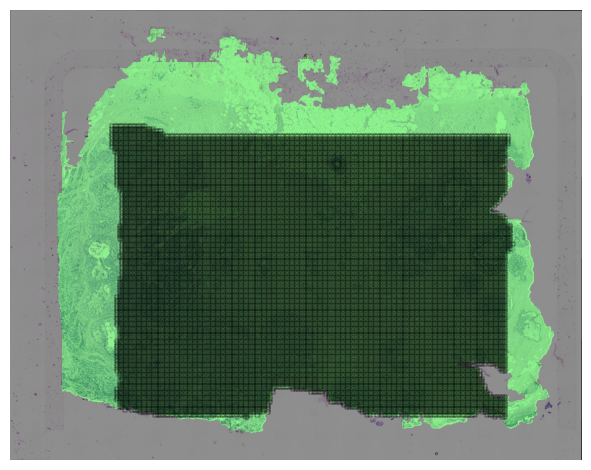

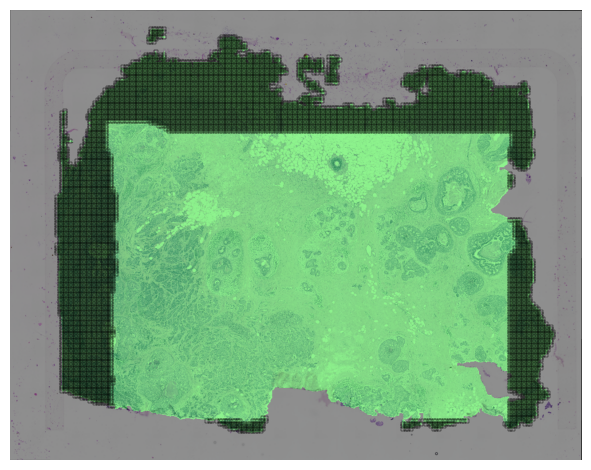

In [9]:
from hest.readers import pool_transcripts_xenium
from hest import iter_hest

new_spot_size = 50
new_patch_size = 224
patch_save_dir = '/mnt/DATA16T/Xenium/wsi_patches/'

# Iterate through a subset of hest
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=['NCBI785'], load_transcripts=True):
    print(st.transcript_df)

    st.adata = pool_transcripts_xenium(
                    st.transcript_df, # Feel free to convert st.transcript_df to a Dask DataFrame if you are working with limited RAM.
                    st.pixel_size, 
                    key_x='he_x',
                    key_y='he_y',
                    spot_size_um=new_spot_size
                )


   # We change the spots, so we need to re-extract the patches
    patcher, barcodes = st.dump_patches(
        patch_save_dir,
        name='NCBI785_spot_50',
        target_patch_size=new_patch_size, # target patch size in 224
        #target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
        target_pixel_size=st.pixel_size,
    )
    # patcher, barcodes = st.dump_noseq_cell_patches(
    #     patch_save_dir,
    #     name='NCBI147_spot_50',
    #     target_patch_size=new_patch_size, # target patch size in 224
    #     #target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
    #     target_pixel_size=st.pixel_size,
    #     centroid_list=centroid_list
    # )

    noseq_patcher, lefttop, before = st.dump_noseq_patches(
        patch_save_dir,
        name='NCBI785_spot_50',
        target_patch_size=new_patch_size, # target patch size in 224
        #target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
        target_pixel_size=st.pixel_size,
        stride=int(new_spot_size/st.pixel_size),
        iou_thresh=0,
    )

In [10]:
images = []
for i in range(len(patcher)):
	images.append(patcher[i][0])

In [11]:
noseq_images = []
for i in range(len(noseq_patcher)):
	noseq_images.append(noseq_patcher[i][0])

In [12]:
import numpy as np
cell_bool = np.isin(st.adata.obs_names.values, barcodes)

In [13]:
spot_adata = st.adata[cell_bool]
spot_adata.obsm['img'] = np.array(images)
spot_adata.uns['wsi_shape'] = [st.wsi.height, st.wsi.width]

/tmp/ipykernel_1391970/3857178012.py:2: ImplicitModificationWarning: Setting element `.obsm['img']` of view, initializing view as actual.
  spot_adata.obsm['img'] = np.array(images)


In [14]:
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=['NCBI785']):

    # ST (adata):
    adata = st.adata
    print('\n* Scanpy adata:')
    print(adata)
spot_adata.uns['spatial'] = st.adata.uns['spatial']

/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/scanpy/preprocessing/_qc.py:432: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]



* Scanpy adata:
AnnData object with n_obs × n_vars = 4180 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'


In [15]:
spot_adata.uns['noseq_img'] = np.array(noseq_images)
spot_adata.uns['noseq_spatial'] = lefttop

In [16]:
spot_adata.write('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer785_spot_adata.h5ad')

In [6]:
len(noseq_patcher)

46032

In [ ]:
xs = [p[0] for p in used_points]
ys = [p[1] for p in used_points]

In [9]:
import numpy as np
x_min = np.min(st.adata.obsm['spatial'][:,0])
x_max = np.max(st.adata.obsm['spatial'][:,0])
y_min = np.min(st.adata.obsm['spatial'][:,1])
y_max = np.max(st.adata.obsm['spatial'][:,1])

In [15]:
from shapely.geometry import Point, box
used_rect = box(x_min, y_min, x_max, y_max)

In [17]:
outside_idx = [not used_rect.contains(Point(pt)) for pt in centroid_list]

In [21]:
patcher[0]

(array([[[248, 177, 237],
         [246, 174, 237],
         [244, 170, 233],
         ...,
         [230, 101, 193],
         [228, 103, 194],
         [230, 105, 196]],
 
        [[250, 176, 235],
         [248, 174, 235],
         [246, 172, 233],
         ...,
         [231,  98, 191],
         [229, 100, 193],
         [230, 101, 194]],
 
        [[250, 175, 234],
         [249, 174, 233],
         [249, 173, 235],
         ...,
         [232,  97, 192],
         [231, 100, 194],
         [232, 101, 195]],
 
        ...,
 
        [[221, 143, 218],
         [228, 147, 223],
         [232, 150, 224],
         ...,
         [197, 121, 212],
         [199, 120, 211],
         [197, 118, 209]],
 
        [[223, 147, 222],
         [229, 151, 227],
         [234, 157, 229],
         ...,
         [197, 121, 211],
         [198, 119, 210],
         [203, 124, 215]],
 
        [[220, 136, 214],
         [229, 145, 223],
         [239, 155, 230],
         ...,
         [201, 128, 218],
  

In [24]:
images = []
positions = []
for i in range(len(patcher)):
	if outside_idx[i]:
		images.append(patcher[i][0])
		positions.append(barcodes[i])

In [ ]:
images = []
for i in range(len(patcher)):
	images.append(patcher[i][0])
import pickle
noseq_data = {'img':images, 'spatial':barcodes}
with open('/mnt/DATA16T/Xenium/Xenium_Human_Colon_Cancer148_noseq_cell.pickle','wb') as f:
	pickle.dump(noseq_data, f)

In [27]:
import pickle
noseq_data = {'img':images, 'spatial':positions}
with open('/mnt/DATA16T/Xenium/Xenium_Human_Colon_Cancer147_noseq_cell.pickle','wb') as f:
	pickle.dump(noseq_data, f)

: 

In [4]:
len(patcher)

3899

In [5]:
len(lefttop)

3760

In [4]:
st.adata

AnnData object with n_obs × n_vars = 5785 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row'
    obsm: 'spatial'

In [ ]:
st.wsi

<bound method HESTData.load_wsi of <hest.HESTData.HESTData object at 0x79fc42ca9160>
        'pixel_size' is 0.2125
        'wsi' is <width=30786, height=19877, backend=OpenSlideWSI>
        'shapes': [name: cellvit, coord-system: he, <loaded>, name: xenium_cell, coord-system: he, <loaded>, name: xenium_nucleus, coord-system: he, <loaded>]>

In [83]:
st.adata.obs['array_col']

000x000     0
000x001     1
000x002     2
000x003     3
000x004     4
           ..
064x083    83
064x084    84
064x085    85
064x086    86
064x087    87
Name: array_col, Length: 5667, dtype: int64

In [14]:
st.pixel_size

0.3639107956749145

In [7]:
len(barcodes)

18170

## Batch effect visualization

In [ ]:
import pandas as pd
from hest.batch_effect import filter_hest_stromal_housekeeping, get_silhouette_score, plot_umap

meta_df = pd.read_csv('../assets/HEST_v1_1_0.csv')


meta_df = meta_df[
    (meta_df['st_technology'] == 'Visium') & 
    (meta_df['disease_state'] == 'Cancer') & 
    (meta_df['oncotree_code'] == 'IDC') & 
    (meta_df['species'] == 'Homo sapiens')
]

# We filter spots, such that:
# - we only keep the most stable housekeeping genes (based on https://housekeeping.unicamp.br/?download)
# - we only keep the spots under the stroma (based on CellViT segmentation)
adata_list = filter_hest_stromal_housekeeping(meta_df, hest_dir='../hest_data')

labels = meta_df['id'].values
score = get_silhouette_score(adata_list, labels=labels)
# (-1: strong overlap between clusters, can be indicative of a small batch effect, 1: poor overlap between clusters, can be indicative of a strong batch effect)
print(f'Silhouette score is {score}')


plot_umap(adata_list, labels, 'batch_whole_tissue.png', umap_kwargs={'min_dist': 0.6})

## Loading transcripts (for Xenium only)
The transcript dataframe contains the following columns:
- `cell_id` (default Xenium Explorer flag): id of cell containing this transcript
- `he_x`, `he_y`: x, y coordinate or transcript on the HE WSI in pixels (aligned with a non-rigid transformation)
- `feature_name`: name of transcript
- `qv` (default Xenium Explorer flag): Phred-scaled quality value (Q-Score) estimating the probability of incorrect call

In [6]:
from hest import iter_hest

# Iterate through a subset of hest
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=['TENX147'], load_transcripts=True):
    print(st.transcript_df)

            transcript_id     cell_id  overlaps_nucleus feature_name  \
0         281895883534663  UNASSIGNED                 0         SPP1   
1         281895883544763  UNASSIGNED                 0       NOTCH3   
2         281895883544764  UNASSIGNED                 0       NOTCH3   
3         281895883685551  UNASSIGNED                 0          MYC   
4         281895883521797  UNASSIGNED                 0        ACTA2   
...                   ...         ...               ...          ...   
46255596  281891588584410  UNASSIGNED                 0        MYH14   
46255597  281891588584414  UNASSIGNED                 0        PRDX4   
46255598  281891588584420  UNASSIGNED                 0        MYH14   
46255599  281891588584423  UNASSIGNED                 0         CD24   
46255600  281891588584428  UNASSIGNED                 0         CD24   

           x_location   y_location  z_location         qv fov_name  \
0           -0.166830  5962.744629   30.104498   7.790324       L

In [1]:
from hest import iter_hest
from hest.readers import pool_cell_transcripts_xenium

# Iterate through a subset of hest
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=['NCBI784'], load_transcripts=True):
    print(st.transcript_df)
    shapes = st.get_shapes('xenium_cell', 'he').shapes
    st.adata = pool_cell_transcripts_xenium(
                    st.transcript_df, # Feel free to convert st.transcript_df to a Dask DataFrame if you are working with limited RAM.
                    st.pixel_size, 
                    shapes=shapes,
                    key_x='he_x',
                    key_y='he_y',
                )

/home/whytin/miniconda3/envs/hest/lib/python3.9/site-packages/hestcore/wsi.py:27: UserWarning: CuImage is not available. Ensure you have a GPU and cucim installed to use GPU acceleration.
  warnings.warn("CuImage is not available. Ensure you have a GPU and cucim installed to use GPU acceleration.")


            transcript_id  cell_id  overlaps_nucleus feature_name  \
0         281474976710656      246                 0     b'ITGAX'   
1         281474976710657      622                 0       b'LUM'   
2         281474976710658      246                 0    b'HAVCR2'   
3         281474976710659      596                 0    b'PTRHD1'   
4         281474976710660      594                 0     b'RUNX1'   
...                   ...      ...               ...          ...   
31997222  281805689296159    93449                 0     b'PELI1'   
31997223  281805689296161    93684                 1      b'CD8B'   
31997224  281805689296162    93449                 0       b'LUM'   
31997225  281805689296164    93684                 1       b'LUM'   
31997226  281805689296167    93684                 0       b'LUM'   

           x_location   y_location  z_location         qv          he_y  \
0            4.575770   470.252106   17.118395  15.507422  10020.703011   
1            5.831209

**Warning:** The segmentation contained in 'xenium_seg/' (accessed with st.get_shapes('xenium_cell', 'he') or st.get_shapes('xenium_nucleus', 'he')) is different than the CellViT segmentation. It was obtained by the Xenium instrument directly by segmenting the DAPI stained image, the DAPI segmented cells were then aligned to H&E with a non rigid transform.

/home/whytin/Research/Project/HEST/src/hest/HESTData.py:379: UserWarning: indices of adata.obs should all have the same length to avoid problems when saving to h5
  warnings.warn("indices of adata.obs should all have the same length to avoid problems when saving to h5", UserWarning)
/home/whytin/Research/Project/HEST/src/hest/HESTData.py:396: UserWarning: Filtered 6589 spots outside the WSI
  warnings.warn(f"Filtered {len_tmp - len(coords_topleft)} spots outside the WSI")
100%|██████████| 109729/109729 [02:54<00:00, 629.69it/s]


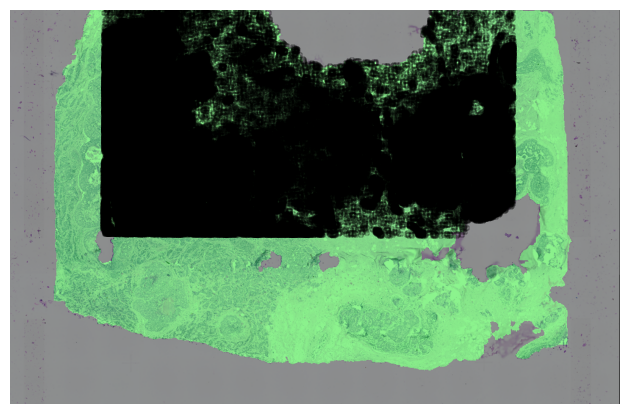

In [2]:
patcher, barcodes = st.dump_patches(
        '/mnt/DATA16T/Xenium/wsi_patches/',
        name='crc784',
        target_patch_size=224, # target patch size in 224
        target_pixel_size=st.pixel_size # pixel size of the patches in um/px after rescaling
    )


In [2]:
import scanpy as sc
xenium_adata = sc.read_h5ad('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer148_cell_HEST.h5ad')

In [6]:
xenium_adata

AnnData object with n_obs × n_vars = 338122 × 541
    obs: 'in_tissue', 'n_counts'
    uns: 'spatial', 'wsi_shape'
    obsm: 'img', 'spatial'

In [1]:
import pandas as pd
df = pd.read_parquet("/mnt/DATA16T/hest_data/cellvit_seg/NCBI784_cellvit_seg.parquet")

In [18]:
import scanpy as sc
xenium_adata = sc.read_h5ad('/mnt/DATA16T/Xenium/Xenium_Human_Colon_Cancer147_cell_TLS_HEST.h5ad')

In [3]:
from shapely import wkb

# 解码 WKB 二进制为多边形
polygons = df.geometry.apply(lambda x: wkb.loads(x, hex=False))

# 提取中心点 (x, y)
centroid_list = [(poly.centroid.x, poly.centroid.y) for poly in polygons]



In [ ]:
patcher, barcodes = st.dump_noseq_cell_patches(
    patch_save_dir,
    name='NCBI147_spot_50',
    target_patch_size=new_patch_size, # target patch size in 224
    #target_pixel_size=0.5 # pixel size of the patches in um/px after rescaling
    target_pixel_size=st.pixel_size,
    centroid_list=centroid_list
)

161199

(28646.882218410523, 705.5471698113207)

In [4]:
import numpy as np
cell_bool = np.isin(st.adata.obs_names.values, barcodes)

In [3]:
images = []
for i in range(len(barcodes)):
	images.append(patcher[i][0])

In [5]:
nuc_adata = st.adata[cell_bool]

In [6]:
nuc_adata.obsm['img'] = np.array(images)

/tmp/ipykernel_1591284/2695875196.py:1: ImplicitModificationWarning: Setting element `.obsm['img']` of view, initializing view as actual.
  nuc_adata.obsm['img'] = np.array(images)


In [7]:
nuc_adata.uns['wsi_shape'] = [st.wsi.height, st.wsi.width]

In [8]:
for st in iter_hest('/mnt/DATA16T/hest_data', id_list=['NCBI784']):

    # ST (adata):
    adata = st.adata
    print('\n* Scanpy adata:')
    print(adata)
nuc_adata.uns['spatial'] = st.adata.uns['spatial']


* Scanpy adata:
AnnData object with n_obs × n_vars = 4180 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mito'
    uns: 'spatial'
    obsm: 'spatial'


In [ ]:
nuc_adata.write('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer784_cell_HEST.h5ad')

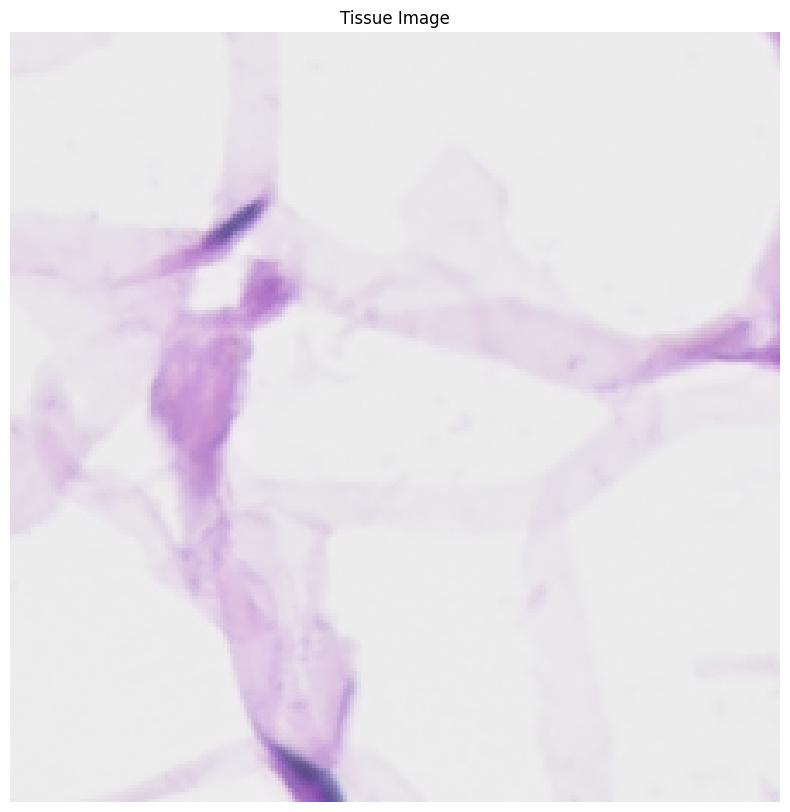

In [20]:
import matplotlib.pyplot as plt

# 检查 img 的形状
#print("Image shape:", adata.uns["img"][0].shape)
i=2000
# 可视化
plt.figure(figsize=(10, 10))
plt.imshow(images[i])


plt.axis("off")  # 隐藏坐标轴
plt.title("Tissue Image")
plt.show()

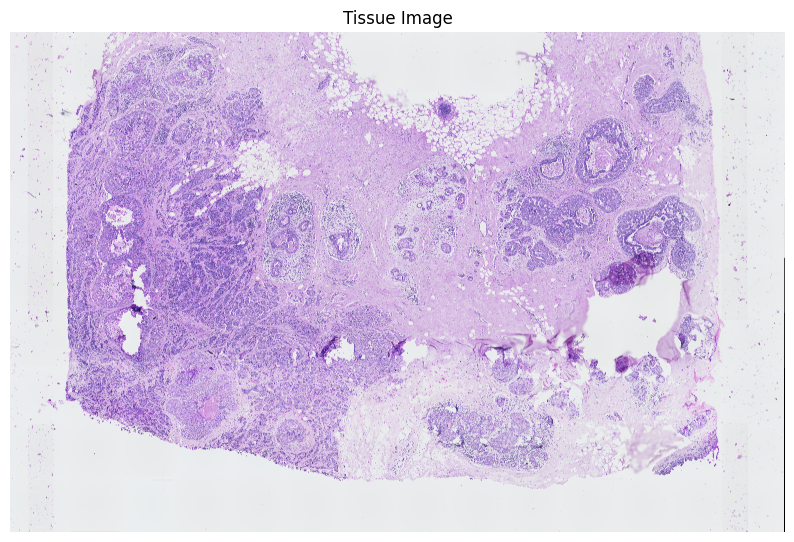

In [ ]:
import matplotlib.pyplot as plt

# 检查 img 的形状
#print("Image shape:", adata.uns["img"][0].shape)
i=2001
# 可视化
plt.figure(figsize=(10, 10))
plt.imshow(images[i])


plt.axis("off")  # 隐藏坐标轴
plt.title("Tissue Image")
plt.show()

In [2]:
import scanpy as sc 
#nuc_adata= sc.read_h5ad('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer785_spot_50_images.h5ad')
nuc_adata = sc.read_h5ad('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer99_spot_50_images.h5ad')

In [14]:
nuc_adata.write('/mnt/DATA16T/Xenium/Xenium_Human_Breast_Cancer99_spot_50_images.h5ad')

In [7]:
noseq_images = []
for i in range(len(noseq_patcher)):
	noseq_images.append(noseq_patcher[i][0])

In [9]:
len(lefttop)

7154

In [11]:
gene_bool = np.isin(st.adata[cell_bool].var_names.values, nuc_adata.var_names.values)

ArrayView([[ 1,  0,  0, ...,  0,  0,  0],
           [ 0,  0,  0, ...,  0,  0,  0],
           [ 1,  0,  0, ...,  0,  0,  0],
           ...,
           [ 6, 29, 15, ...,  0,  0,  0],
           [ 0, 14,  7, ...,  0,  0,  0],
           [13, 41, 23, ...,  0,  0,  0]], dtype=uint16)

In [20]:
nuc_adata.var_names

Index(['LUM', 'TCIM', 'HAVCR2', 'CXCR4', 'SEC11C', 'RUNX1', 'STC1', 'PTRHD1',
       'ITGAX', 'LPXN',
       ...
       'KLRB1', 'CD27', 'CCDC80', 'KRT8', 'ENAH', 'CD14', 'NOSTRIN', 'SNAI1',
       'MYH11', 'GNLY'],
      dtype='object', length=274)

In [12]:
nuc_adata.raw = st.adata[cell_bool][:, gene_bool]

In [ ]:
nuc_adata.uns['spatial'] = st.adata.uns['spatial']

AnnData object with n_obs × n_vars = 81528 × 274
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_counts'
    var: 'gene_id', 'id_in_vocab'
    uns: 'log1p'
    obsm: 'gene_embed', 'img', 'spatial', 'virchow2_embed'

In [6]:
st.adata

AnnData object with n_obs × n_vars = 23060 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mito'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
import numpy as np
nuc_adata.uns['noseq_img'] = np.array(noseq_images)
nuc_adata.uns['noseq_spatial'] = lefttop

In [24]:
np.array(st.adata[cell_bool].X)

array([[  3, 150,   7, ...,   0,   0,   0],
       [  5, 179,   9, ...,   0,   0,   0],
       [  4, 168,   2, ...,   0,   0,   0],
       ...,
       [  0,   8,   0, ...,   0,   0,   0],
       [  0,   9,   0, ...,   0,   0,   0],
       [  1,  14,   0, ...,   0,   0,   0]], dtype=uint16)

In [10]:
st.adata.uns['spatial']

KeyError: 'spatial'

In [5]:
import numpy as np
nuc_adata.uns['wsi_shape']=[st.wsi.height, st.wsi.width]

In [15]:
nuc_adata.uns['noseq_img'] = np.array(images)

In [16]:
nuc_adata.uns['noseq_spatial']=lefttop

In [17]:
nuc_adata

AnnData object with n_obs × n_vars = 3899 × 541
    obs: 'in_tissue', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'array_col', 'array_row', 'n_counts'
    uns: 'spatial', 'wsi_shape', 'noseq_img', 'noseq_spatial'
    obsm: 'img', 'spatial'

In [ ]:
nuc_adata.uns['spatial']=st.adata.uns['spatial']

{'ST': {'images': {'downscaled_fullres': array([[[235, 236, 239],
           [234, 235, 238],
           [235, 236, 239],
           ...,
           [  0,   0,   0],
           [  0,   0,   0],
           [  0,   0,   0]],
   
          [[236, 237, 239],
           [236, 236, 239],
           [235, 236, 239],
           ...,
           [236, 238, 239],
           [235, 238, 239],
           [236, 238, 239]],
   
          [[236, 236, 239],
           [235, 236, 239],
           [236, 236, 239],
           ...,
           [235, 238, 239],
           [235, 238, 238],
           [236, 238, 239]],
   
          ...,
   
          [[236, 238, 239],
           [235, 238, 239],
           [235, 238, 239],
           ...,
           [236, 238, 238],
           [236, 238, 239],
           [  0,   0,   0]],
   
          [[236, 238, 239],
           [236, 238, 239],
           [235, 238, 239],
           ...,
           [236, 239, 239],
           [236, 238, 239],
           [  0,   0,   0]],
  

In [45]:
print("ERBB2" in nuc_adata.var_names)  

True


In [43]:
h, w = nuc_adata.uns['spatial']['ST']['images']['high_res'].shape[:2]

KeyError: 'high_res'

In [44]:
h, w = nuc_adata.uns['wsi_shape']

In [ ]:
nuc_adata

array([[  3, 150,   7, ...,   0,   0,   0],
       [  5, 179,   9, ...,   0,   0,   0],
       [  4, 168,   2, ...,   0,   0,   0],
       ...,
       [  0,   8,   0, ...,   0,   0,   0],
       [  0,   9,   0, ...,   0,   0,   0],
       [  1,  14,   0, ...,   0,   0,   0]], dtype=uint16)

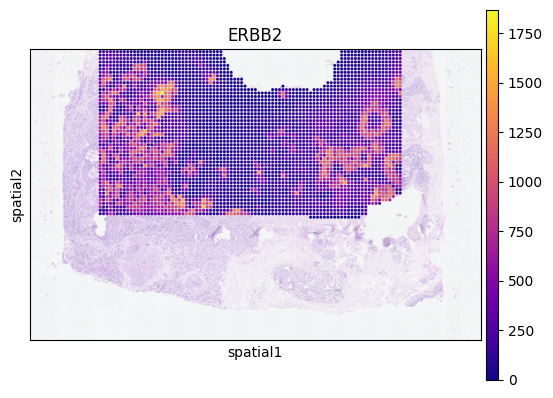

In [52]:
sc.pl.spatial(
    nuc_adata,
    color="ERBB2",        
    img_key='downscaled_fullres',          # 也可选，默认使用 'hires' 或 'lowres'
    spot_size=200,
    cmap="plasma",
    alpha=1.0,         # 点不透明
    alpha_img=0.5, 
    crop_coord=(0, w, 0, h)
)

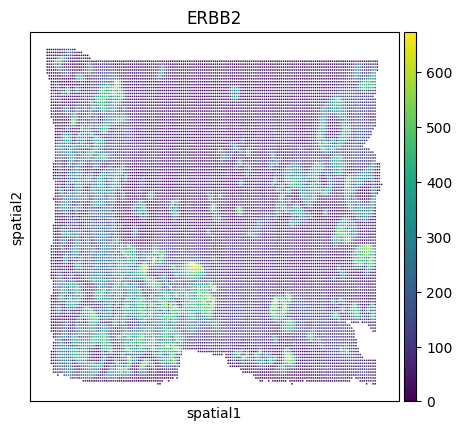

In [49]:
import scanpy as sc

# 假设你已经加载好了 AnnData 对象：adata
nuc_adata.obsm["spatial"] = (nuc_adata.obsm["spatial"] - nuc_adata.obsm["spatial"].min(0)) / \
                        (nuc_adata.obsm["spatial"].max(0) - nuc_adata.obsm["spatial"].min(0))
sc.pl.spatial(nuc_adata, color="ERBB2", img_key=None, spot_size=0.005)


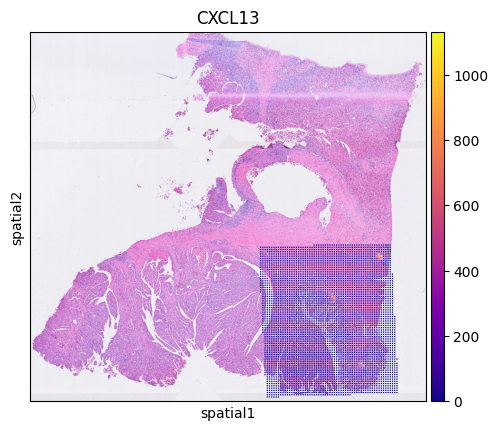

In [ ]:
import scanpy as sc
sc.pl.spatial(
    st.adata,
    color="CXCL13",        
    img_key='downscaled_fullres',          # 也可选，默认使用 'hires' 或 'lowres'
    spot_size=200,
    cmap="plasma",
    alpha=1,         # 点不透明
    alpha_img=1, 
    crop_coord=(0, st.wsi.width, 0, st.wsi.height)
)

In [39]:
# 检查非零表达比例
expr = nuc_adata[:, "ERBB2"].X
print(f"Non-zero proportion: {(expr > 0).mean()}")

Non-zero proportion: 0.9959161282457637


In [8]:
sample_index = np.random.choice(range(len(barcodes)), 50000, replace=False)

In [9]:
sample_adata = nuc_adata[sample_index]

In [10]:
sample_adata.write_h5ad('/mnt/DATA16T/Xenium/Xenium_Human_Colon_Cancer149_nuc_images_samples_50k.h5ad')

### Linking transcripts with cells
Each transcript is associated with a cell id (derived by the Xenium analyzer directly). See column `cell_id` in the transcript dataframe.

In [ ]:
transcripts = st.transcript_df
shapes = st.get_shapes('xenium_cell', 'he').shapes

cell_id = 1

# Print the transcripts associated with a particular cell
print(transcripts[transcripts['cell_id'] == cell_id])
print(shapes[shapes.index == cell_id])
